In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torchvision
import os
from matplotlib import pyplot
from PIL import Image

# Convert a PIL image to a PyTorch float tensor
img2t = torchvision.transforms.ToTensor()
# Convery a PyTorch float tensor to a PIL image
t2img = torchvision.transforms.ToPILImage()

In [14]:
# Thresholding
def apply_threshold(image, threshold_value=120):
    _, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY_INV)
    plt.imshow(thresholded_image, cmap='gray')
    plt.show()
    return thresholded_image

# Morphological Opening
def apply_morphological_opening(image, kernel_size=15):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    opened_image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
    plt.imshow(opened_image, cmap='gray')
    plt.show()
    return opened_image

# Gaussian Blur
def apply_gaussian_blur(image, kernel_size=15, sigma=0):
    blurred_image = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)
    plt.imshow(blurred_image, cmap='gray')
    plt.show()
    return blurred_image

# Top-Hat Transform
def apply_tophat_transform(image, kernel_size=15):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    tophat = cv2.morphologyEx(image, cv2.MORPH_TOPHAT, kernel)
    plt.imshow(tophat, cmap='gray')
    plt.show()
    return tophat

# Bilateral Filtering
def apply_bilateral_filter(image, d=9, sigma_color=75, sigma_space=75):
    filtered_image = cv2.bilateralFilter(image, d, sigma_color, sigma_space)
    plt.imshow(filtered_image, cmap='gray')
    plt.show()
    return filtered_image

# Remove Large-Scale Cloudiness
def remove_cloudiness(image, kernel_size=51, clahe_clip_limit=2.0, clahe_tile_grid_size=8):
    blurred = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    corrected = cv2.subtract(image, blurred)
    corrected_normalized = cv2.normalize(corrected, None, 0, 255, cv2.NORM_MINMAX)
    clahe = cv2.createCLAHE(clipLimit=clahe_clip_limit, tileGridSize=(clahe_tile_grid_size, clahe_tile_grid_size))
    final_image = clahe.apply(corrected_normalized)
    plt.imshow(final_image, cmap='gray')
    plt.show()
    return final_image

import cv2
import matplotlib.pyplot as plt

def invert_image(image):
    # Perform the inversion
    inverted = cv2.bitwise_not(image)
    plt.imshow(inverted, cmap='gray')
    plt.show()
    return inverted


In [5]:
# load preprocessing file

file_path = rf"data/filename_data.csv"
df = pd.read_csv(file_path, delimiter=';')
df.head()

,Unnamed: 0,name,cell_type,well_number,location_number,tag,data_type,file_format,path,filename,subfolder,sample_site,z_position,channel,has_mask
0,0,Alexa488,Fibroblasts,well1,50locations,s01z01c2,ORG,tif,./data/brightfield\Alexa488_Fibroblasts_well1_...,Alexa488_Fibroblasts_well1_50locations_s01z01c...,Alexa488_Fibroblasts_well1_50locations,1,1,2,False
1,1,Alexa488,Fibroblasts,well1,50locations,s01z02c2,ORG,tif,./data/brightfield\Alexa488_Fibroblasts_well1_...,Alexa488_Fibroblasts_well1_50locations_s01z02c...,Alexa488_Fibroblasts_well1_50locations,1,2,2,False
2,2,Alexa488,Fibroblasts,well1,50locations,s01z03c2,ORG,tif,./data/brightfield\Alexa488_Fibroblasts_well1_...,Alexa488_Fibroblasts_well1_50locations_s01z03c...,Alexa488_Fibroblasts_well1_50locations,1,3,2,False
3,3,Alexa488,Fibroblasts,well1,50locations,s01z04c2,ORG,tif,./data/brightfield\Alexa488_Fibroblasts_well1_...,Alexa488_Fibroblasts_well1_50locations_s01z04c...,Alexa488_Fibroblasts_well1_50locations,1,4,2,False
4,4,Alexa488,Fibroblasts,well1,50locations,s01z05c2,ORG,tif,./data/brightfield\Alexa488_Fibroblasts_well1_...,Alexa488_Fibroblasts_well1_50locations_s01z05c...,Alexa488_Fibroblasts_well1_50locations,1,5,2,False


In [11]:
def load_images(df, well, focal_point):
    # Filter the DataFrame for the given well and focal point
    image_paths = df.loc[(df['well_number'] == well) & (df['z_position'] == focal_point)&(df['has_mask'] == False)]['path'].values
    mask_paths = df.loc[(df['well_number'] == well) & (df['z_position'] == 6) & (df['has_mask'] == True)]['path'].values
    
    images = []
    masks = []
    
    # Load images
    for image_path in image_paths:
        image = Image.open(image_path)
        images.append(img2t(image))  # Store both PIL image and tensor
        
    # Load masks
    for mask_path in mask_paths:
        mask = Image.open(mask_path)
        masks.append(img2t(mask))
    
    return images, masks

Number of images loaded: 51
Number of masks loaded: 51
First image shape (tensor):  torch.Size([1, 1024, 1024])


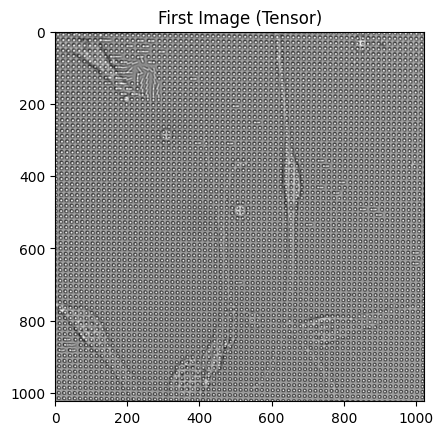

First mask shape:  torch.Size([1, 1024, 1024])


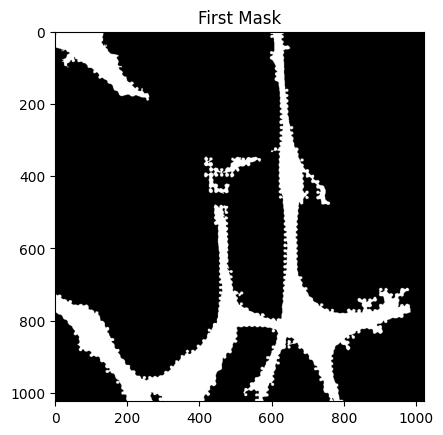

In [ ]:
images, masks = load_images(df, 'well1', 3)

# Print the number of images and masks loaded
print(f"Number of images loaded: {len(images)}")
print(f"Number of masks loaded: {len(masks)}")

# Print and display the first image and mask if they exist
if images:
    print("First image shape (tensor): ", images[0].shape)
    # Display the tensor image
    plt.imshow(t2img(images[0]), cmap='gray')
    plt.title("First Image (Tensor)")
    plt.show()


if masks:
    print("First mask shape: ", masks[0].shape)
    plt.imshow(t2img(masks[0]), cmap='gray')
    plt.title("First Mask")
    plt.show()

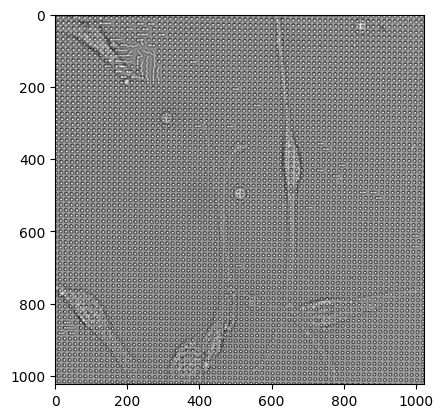

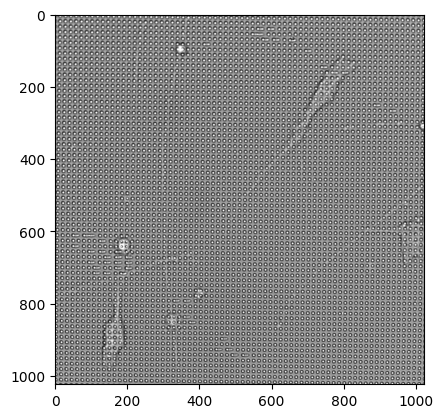

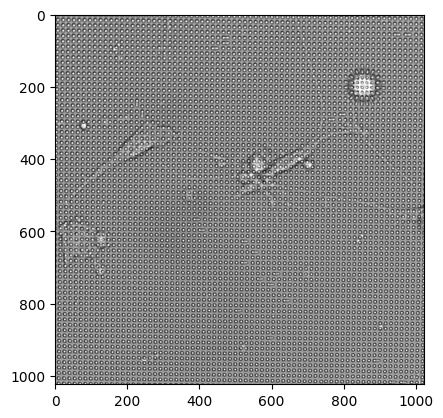

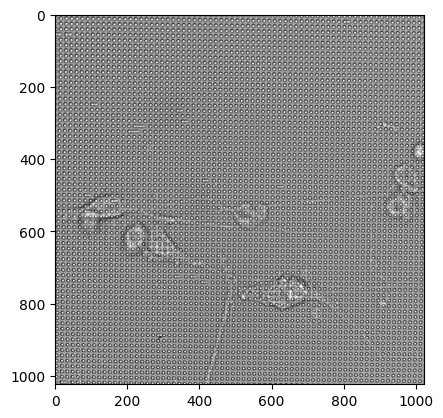

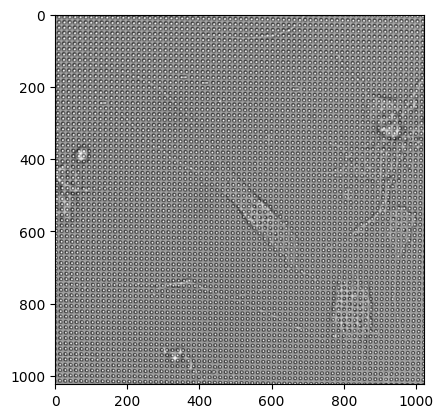

...

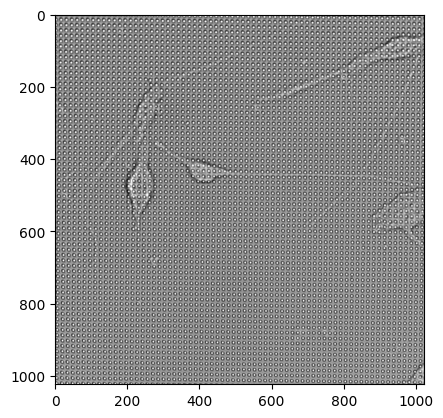

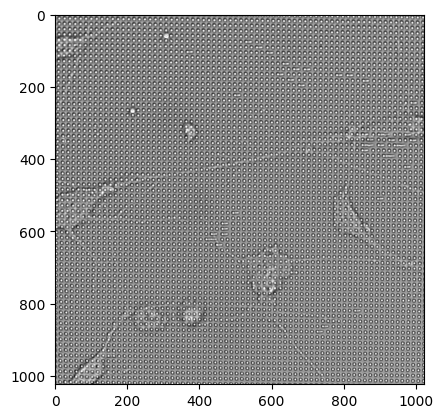

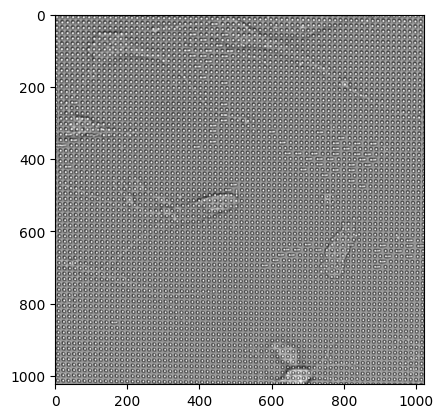

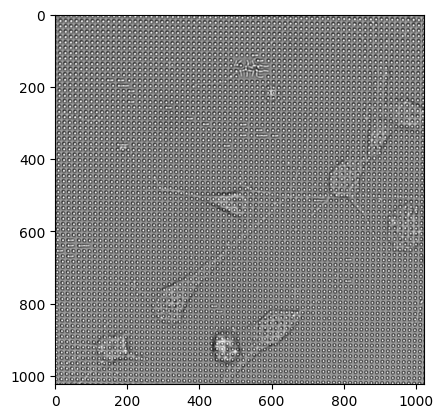

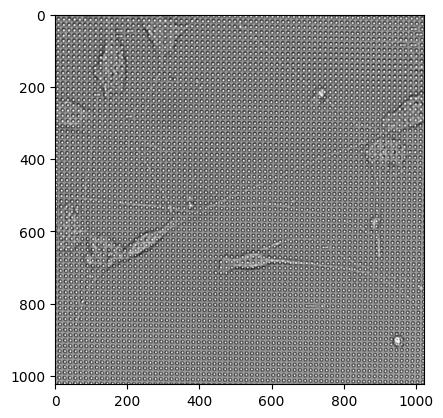

In [8]:
for sample in range(45):
    test_image = t2img(images[sample])
    test_mask = t2img(masks[sample])
    plt.imshow(test_image, cmap='gray')
    plt.show()

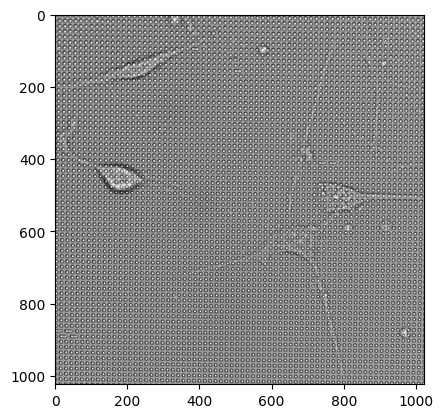

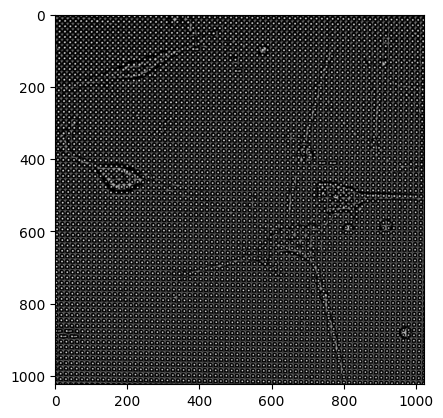

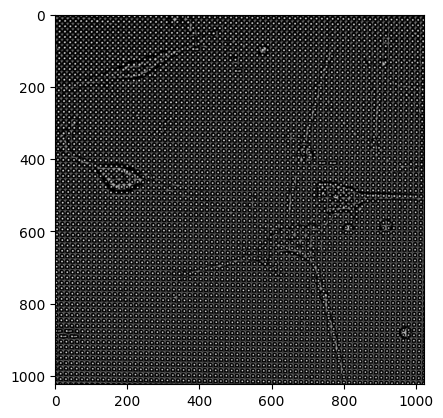

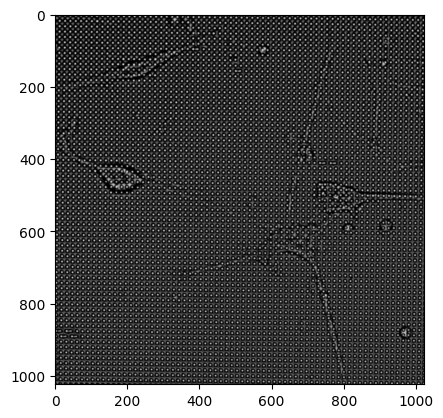

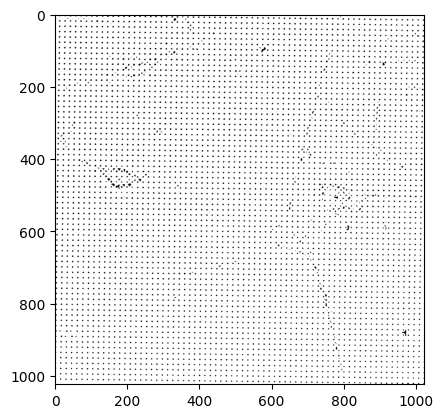

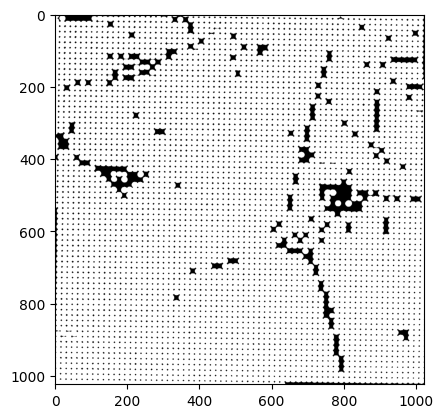

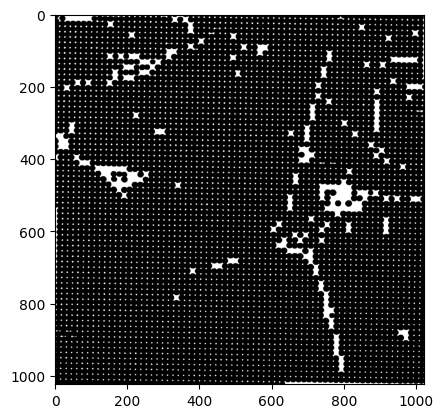

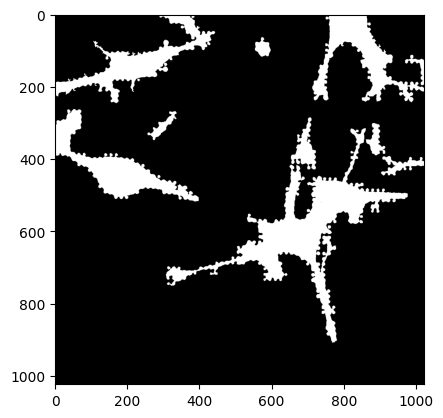

In [15]:
sample = 17
test_image = t2img(images[sample])
test_mask = t2img(masks[sample])
plt.imshow(test_image, cmap='gray')
plt.show()
test_image_np = np.array(test_image)  # Convert PIL image to NumPy array
cloudiness_removed = remove_cloudiness(test_image_np, kernel_size=51)
tophat_image = apply_tophat_transform(cloudiness_removed, kernel_size=15)
blurred_image = apply_gaussian_blur(tophat_image, kernel_size=5, sigma=0)
thresholded = apply_threshold(blurred_image, threshold_value=120)
opened_image = apply_morphological_opening(thresholded, kernel_size=15)
final_mask = invert_image(opened_image)
plt.imshow(final_mask, cmap='gray')
plt.imshow(test_mask, cmap='gray')
plt.show()